# Project 1: Classification of hadronic jets
---
_Responsible:_ Andreas Sogaard (<andreas.sogaard@ed.ac.uk>)

In this project, you will apply some of the machine learning skills you have acquired in the course so far to tackle a real-world particle physics problem: classification of hadronic jets, to identify signs of physics beyond the Standard Model.


### Background

In partcle physics experiments like the [ATLAS](https://atlas.cern/) experiment at [CERN](https://home.cern/), proton-proton ($pp$) collisions often lead to the emission of high-energy colour-charged particles (quarks and gluons; collectively referred to as "partons"). Because colour-charged particles cannot exist in isolation but must be confined in colour-neutral bound states, such high-energy parton emissions will radiate off more particles and eventually hadronise, resulting in a collimated sprays of stable, hadronic particles. Such a spray is called a _jet_, and it manifests as a shower of high-energy particles in experiments like ATLAS.

To reconstruct these jets, robust jet _clustering algorithms_ are typically used. These algorithms cluster particles in the [_pseudorapidity_](https://en.wikipedia.org/wiki/Pseudorapidity) ($\eta$; "eta") vs. _azimuth_ ($\phi$; "phi") plane, that is typically used in particle collider experiments (see note below). You can think of this as a regular, Cartesian $x$- and $y$-axis coordinte system. This clustering proceeds sequentially until a small number of jets are retained. The jet clustering algorithms are characerised by a radius parameter $R$, meaning that you can roughly think of jets as cones of particles in the $\eta-\phi$ coordinate system with a radius of $R$. In this project, a radius parameter of $R = 1$ was used to reconstruct the jets. The particles that are assigned to each jet are called the _constituents_ of the jet.

Now, apart from the more common Standard Model processes resulting in jets, there are also a number of rare processes that give rise to jets. For instance, many models of physics beyond the Standard Model predict the existence of new, high-mass particles that can decay to quarks, which in turn produce jets which are measured in the detector. The challenge is then to classify which jets originated from the rare decay of a massive particle (_e.g._ the $W$ and $Z$ bosons, or hypothesised heavier versions of these, called $W'$ and $Z'$), and which jets originated from the emission of a single, high-energy parton which are copiously produced in known Standard Model interactions.

One way to distinguish between so-called resonant jets, originating from the decay of massive particles, and so-called continuum background jets, originating from the non-resonant emission of single partons, is by their invariant mass: Since all fundamental interactions convser energy and momentum, a particle $Z'$ with mass $m_{Z'}$ decaying to quarks may be reconstructed as a jet with mass $m_{J} \approx m_{Z'}$. This equality is inexact due to the resolution of the experiment; leakage of energy into, or out of, the jet cone; contamination of particles from other $pp$ interactions; _etc._ However, the jet mass is still a very useful discriminator for identifying resonant decays.

The problem is that continuum jets are orders of magnitude more likely to be produced than jets from resonant decays, which means that — purely by chance — there will be a lot of jets with $m_{J} \approx m_{Z'}$ that did _not_ originate from the decay of some massive particle $Z'$. Another way to distinguish jets which happen to have similar masses is through their _substructure:_ "Interesting" jets will typically result from a resonant decay to two or three quarks, each of which produce a collimated spray of particles; this will result in a jet with an internal structure characterised by two or three energic "lobes," also called _subjets_. By contrast, continuum jets will be dominated by a single high-energy emission, and will therefore (to first order of approximation) be comprised of a single, high-energy subjet. We can therefore define a number of high-level variables that attempt to quantify different aspects of this substructure, and thereby hope to better distinguish between these classes of jets. 

In this project, you will explore a few different data representations of the same physical jets, and see how well you are able to distinguish background jets from two classes of signal jets, originating from the decay of different massive particles.


#### Note on the ATLAS coordinate system

In the standard ATLAS coordinate system, the origin is located at the nominal interaction point (IP), the $x$-axis points from the IP towards the centre of the LHC, the $y$-axis points upwards, and the $z$-axis points along the path of one of the incoming proton beams. Here, the azimuthal angle ($\phi$) is the angle of a particle in the plane transverse to the $z$-axis, measured starting from the positive $x$-axis. The pseudorapidity ($\eta$) is related to a particle's angle relative to the $z$-axis: A particle with $\eta = 0$ is emitted from the IP perpendicularly to the $z$-axis; particles with $\eta = \pm\infty$ are emitted parallel to the positive resp. negative $z$-axis. Since all (well, most) particles emanate from the IP, it is convenient to parametrise their trajectories using these two angles. Similarly, it is common in ATLAS to work in so-called _transverse quantities_ — _e.g._ the transverse momentum $p_{\mathrm{T}}$, which is the component of a particle's momentum that is perpendicular to the $z$-axis — rather than in quantities like the 3-momenetum $p$ itself. This is because all collisions start out with approximately zero vector sum momentum in the transverse plan (the initial-state protons move along the $z$-axis, and so have virtually no transverse momentum), and momentum conservation implies that the vector sum of transverse energy in the final state should therefore also be zero. In contrast, the energy of the initial-state protons along the $z$-axis is not well-defined, and the sum of energy along the $z$-axis is almost impossible to measure exactly, since detectors are not hermetic and so particles can "escape" the detector along the beam direction undetected.

### Datasets

The data you should use in this project can be found here:

<div align="center"><a href="https://cernbox.cern.ch/index.php/s/267DAVt1CPkJ77A">https://cernbox.cern.ch/index.php/s/267DAVt1CPkJ77A</a></div>

It contains two folders: `train/` and `test/`, containing data on 150'000 and 15'000 jets, respectively. Each folder contains three different data representations of the same hadronic jets:

1. Standard high-level **variables,** calculated using physics knowledge. This is a collections of variables used in a range of physics analyses in experiments like ATLAS. (Check below to see what these are called.)
2. 2D pixelated **images** of the jets in the pseudorapidity ($\eta$) vs. azimuth ($\phi$) plane; the pixel intensity is given by the sum of energy of jet constituents falling within each pixel. The images are centered on the highest momentum subjet, and come in three variants:
    1. No transformations are applied.
    2. Before pixelation, the constiuents are rotated such that the second-highest momentum subjet is oriented along the negative $\phi$- (or $y$-) axis.
    3. As in B., but the image is flipped such that the third-highest momentum subjet is along the positive $\eta$- or ($x$-) axis.
3. Low-level information about the jet **consitituents** themselves. This is the information used to compute the high-level variables and prepare the jet images. The file contains the transverse momentum ($p_{\mathrm{T}}$) of each of the 100 highest-$p_{\mathrm{T}}$ constituents for each jet, along with the pseudorapidity ($\eta$) and the azimuthal angle ($\phi$), relative to the jet axis, of each constituent. Jets with less than 100 constituents are zero-padded to have a regular shape.

Across all of the datasets, energetic variables such as the jet mass and $p_{\mathrm{T}}$ are in units of giga-electronvolts ($\mathrm{GeV}$); all other variables are unitless.

Each of the three data files has the same number of rows, and rows with the same index in each file correspond to the same physical jet. You are free to mix and match the data as you see fit, to best be able to classify the jet.

### Labels
The data files comprise jets from three different processes, indicated by the `signal` column, present in every data file in the training dataset: background jets (`signal == 0`) and two types of signal jets (`signal == 1` and `signal == 2`), resp. **Your task** is to either do:
1. binary classification of background vs. both signals, or
2. multi-class classificaton of background vs. signal 1 vs. signal 2, or
3. both.

The only difference between the files in the `train/` and the `test/` folder is that the training data are labelled, _i.e._ they contain a `signal` column, whereas the testing data are not labelled. This is how things would work in a real physics appliction: You train on labelled Monte Carlo (MC) simulated data, and then apply the methods to real, recorded data where you don't have per-example labels. **Your job is then to develop robust, performant methods on the training datasets such that these generalise well to the unseen data in the testing dataset.**

### Weights
Finally, the three types of jets have somewhat different $p_{\mathrm{T}}$. This is a result of the way the samples are generated, and we typically don't want our machine learning algorithms to be dependent on, or "learn to exploit," such differences. Therefore, a _weight_ has been assigned to each jet in the `weight` column, present in every data file. When you fill histograms, train machine learning models, _etc._ you should use these weights, since they will effectively remove undesirable kinematic differences between the process. *(NB: Most machine learning fitting methods will have a `sample_weight=...` argument, and most visualisation methods will have a `weights=...` argument, that you can use.)*

### Notes on assessment

Here is an incomplete list of potential studies you could do, by training:

* A decision tree (DT) based classifier on the high-level variables
* A flat deep neural network (DNN) classifier on the high-level variables
* A convolutional neural network (CNN) classifier on the images (one or more of image classes A, B, and C)
* Three separate CNNs with the same hyperparameters on each of the three image class, to assess impact of preprocessing
* A recurrent neural network (RNN) classifier on the jet constituents as a $p_{\mathrm{T}}$-ordered sequence
* A (variational) auto-encoder (VAE, AE) on the images for anomaly detection
* A VAE on the images for image generation
* A mass-decorrelated neural network classifier, using adversarial training on the high-level variables
* A graph convolutional network (GCN) classifier on the jet constituents as a graph with adjacency given _e.g._ by the angular separation between the constituents $i$ and $j$, $\Delta R_{ij} = \sqrt{(\Delta\eta_{ij})^{2} + (\Delta\phi_{ij})^{2}}$. You can use the pre-installed `pytorch` and `pytorch-geometric` libraries for this
* _Etc._

To complete this project, you should:
* Perform **around three or four studies** similar to the above (but not necessarily restricted to just these), **using at least two of the three types different data representations** (or: types of input data). Clearly label/number your studies, discuss the results, and compare their relative merits.
    * If you do any neat studies that don't result in a classification variable, _e.g._ image generation, that still very much counts!
* **Submit your Jupyter notebook** as a "report." See the comments below on documentation,
* **Submit your class predictions on the test dataset** for a course leaderboard (choose your favourite method developed in your studies).
    * We will have two leaderboards: One for binary classification (background vs. both signals) and one for multi-class classification (background vs. signal 1 vs. signal 2).
    * You can submit for either or both leaderboards; you should submit for at least one.
    * You get points for submitting; I don’t care about your score, but try to make the best effort you can.
    * The leaderboard metric will be **the weighted average accuracy** on the testing dataset, calculated using the `daml.project.evaluate()`, which you are free (even encouraged) to use in your own studies.
    * The highest scoring submission on each leaderboard will be rewarded with a candy bar, soft drink, or similar of the winners' choice.
    * **To save your predictions** to file, use the `daml.project.save_submission()` method. This is done to standardise the submissions. _If you have any problems using this method, let me know!_ The testing dataset predictions should be **in the same order** as the testing dataset inputs.
    * You can submit to the leaderboard as many times as you like; your last submission (for each leaderboard) will be used.
    
When doing each of your studies, you should try to follow the below steps (where it makes sense; rough weight in marking indicated in parentheses):

1. **Data exploration and preprocessing (10%):** Inspect the datasets; visualise the data in an appropriate way; study the impact of the provided weights; perform any necessary preprocessing.
2. **Model selection (30%):** Choose a promising approach; construct the machine learning model; optimise the relevant hyperparameters; train your chosen model.
3. **Performance evaluation (20%):** Evaluate the model in a way that gauges its ability to generalise to unseen data; compare to other approaches; identify the best approach. Useful performance measures include class accuracy, see _e.g._ the `daml.project.evaluate()` method, and the _reciever-operating characteristic_ (ROC) curve; see _e.g._ the `plot.roc()` method for inspiration.
4. **Discussion, style throughout (40%):** Discuss the reasoning or intuition behind your choices; the results you obtain through your studies; the relative merits of the methods you have developed, _etc._ Similarly, make sure that you write efficient code, document your work, clearly convey your results, and convince us that you have mastered the material.


That is, **you should submit, by 29 November 2019 at 4pm:**
* your report notebook via Turnitin.
* your leaderboard submission(s) here:
<div align="center"><a href="https://cernbox.cern.ch/index.php/s/NYyp7cT7a1stV87">https://cernbox.cern.ch/index.php/s/NYyp7cT7a1stV87</a></div>
    
Below are some (masked) **benchmark scores** for the multi-class classification leaderboard, calculated on the testing dataset:

| <p align="left"> Approach                         |  Accuracy  |
| ------------------------------------------------- | ---------- |
| <p align="left"> "The Beast"(TM)                  | **87.43%** |
| <p align="left"> Advanced method 1                |   86.06%   |
| <p align="left"> Simple method 1 (with weighting) |   85.55%   |
| <p align="left"> Advanced method 2                |   84.95%   |
| <p align="left"> Simple method 1 (no weighting)   |   83.57%   |
| <p align="left"> Advanced method 3                |   81.12%   |
| <p align="left"> Simple method 2                  |   79.89%   |
| <p align="left"> Random guessing                  |   33.33%   |
    
This tells you that there is quite a bit of long-hanging fruit, _i.e._ it is easy to get to 80%, but a lot harder to get near 90%. **You don't have to beat any particular benchmark,** but they can hopefully serve as guide for what constitutes reasonable results. The differences in model performance are quite small, as you can see, so fine-tuning your models and a good understanding of the data is key to getting the best performance you can. 

We're not looking for high scores (although those are nice too), **we're mostly concerned with _best practices:_** If you are careful and deliberate in your work, and show us that you can use the tools introduced in the course so far, we're happy!

Training all of these models in sequence took ca. 1 hour in all on my laptop, without using GPUs, so **don't spend hours on training hundreds of epochs.** Note, that when your predictions on the testing dataset are evaluated for the leaderboard, they will be weighted using weights like the ones with which you have been provided, so your predictions will likely be sub-optimal if you use a different (or no) set of weights; but it is up to you.

The checkpoints in this track of the course have been very challenging, so I would like to emphasise that although this project is worth 13.5% of your course mark, compared to 3.5% for the checkpoints, and although you have roughly four times as long to do the project, **you are not expected to _spend_ four times the amount of time or effort on this project compared to the checkpoints.** (As far as I am concerned, you have already earned your marks.)

**If the project description is unclear, or if you experience any technical issues, please do let me know as quickly as possible. I can send around clarifications if I think it would be to the benefit of the entire class.**


### Documentation

Your reportnotebook should run without errors and give (mostly) reproducible results. It is important that **all** code is annotated and that you provide brief commentary **at each step** to explain your approach. Explain *why* you chose a given approach and *discuss* the results. You can also include any failed approaches if you provide reasonable explanation; we care more about you making an effort and showing that you understand the core concepts.

This is not in the form of a written report so do not provide pages of background material, but do try to clearly present your work so that the markers can easily follow your reasoning and can reproduce each of the steps through your analysis. Aim to convince us that you have understood the material covered in the course.

To add commentary above (or below) a code snippet create a new cell and add your text in "Markdown" format. Do not add any substantial commentary as a code comment in the same cell as the code. To change the new cell into markdown select from the drop down menu on the bar above the main window (the default is code)

## Loading in data
---

In [1]:
# Minimal import(s)
import h5py
import pandas as pd

In [2]:
# Define paths for directories containing the training and testing data, which 
# can be downloaded from the CERNBox mentioned above.
dir_train = 'data/train/'
dir_test  = 'data/test/'

In [3]:
# Load the image dataset
with h5py.File(dir_train + 'images.h5', 'r') as hf: 
    print(list(hf.keys()))
    index  = hf['index'][:]
    signal = hf['signal'][:]
    weight = hf['weight'][:]
    imgsA  = hf['TypeA'][:]
    imgsB  = hf['TypeB'][:]
    imgsC  = hf['TypeC'][:]
    pass

['TypeA', 'TypeB', 'TypeC', 'index', 'signal', 'weight']


In [4]:
# Print the number of training examples of each type
(signal == 0).sum(), (signal == 1).sum(), (signal == 2).sum()

(50000, 50000, 50000)

In [5]:
# Load the high-level variable dataset
df_variables = pd.read_hdf(dir_train + 'variables.h5')
df_variables.head()

,signal,weight,pt,eta,phi,mass,trimmed_mass,tau1,tau2,tau3,...,e2_2,e3_1,e3_2,C2_1,C2_2,D2_1,D2_2,KtDR,split12,zcut12
0,0.0,0.754563,1429.054644,-0.028279,-1.439182,580.472667,577.555367,0.367105,0.123122,0.073896,...,0.172761,0.013206,2.353134e-03,0.216721,0.078841,0.877957,0.456359,0.827116,4.260592,0.030324
1,1.0,1.310081,1408.621118,0.130361,1.020697,141.026068,122.603590,0.086625,0.022405,0.007289,...,0.010039,0.000190,1.966541e-05,0.078947,0.195127,1.607889,19.436861,0.164426,3.186888,0.067179
2,1.0,1.192072,1435.895464,0.920718,1.786299,103.053433,102.466559,0.059406,0.007547,0.006387,...,0.005145,0.000027,5.416519e-08,0.024938,0.002046,0.762363,0.397717,0.165370,2.727562,0.067331
3,0.0,1.041173,1498.936431,-1.539387,1.602722,106.238439,19.442190,0.013582,0.015790,0.010710,...,0.005015,0.000035,5.159801e-06,0.272764,0.205177,24.135950,40.914481,0.012364,1.701913,0.026541
4,2.0,0.635794,1647.535791,-0.091315,2.582996,436.770586,383.033950,0.222138,0.047988,0.029031,...,0.070069,0.002468,4.849675e-04,0.152270,0.098777,1.196044,1.409698,0.552331,3.821762,0.032358


In [6]:
# Load the jet constituents dataset
df_constituents = pd.read_hdf(dir_train + 'constituents.h5')
df_constituents.head()

,signal,weight,pt_0,dEta_0,dPhi_0,pt_1,dEta_1,dPhi_1,pt_2,dEta_2,...,dPhi_96,pt_97,dEta_97,dPhi_97,pt_98,dEta_98,dPhi_98,pt_99,dEta_99,dPhi_99
0,0.0,0.754563,135.673279,0.175755,0.594801,107.982437,0.176698,0.595199,65.615959,-0.135211,...,-0.145322,1.486121,0.120671,0.642919,1.442553,-0.123897,-0.396118,1.307768,0.076032,-0.3082
1,1.0,1.310081,699.050415,-0.072847,0.006429,412.251099,0.113484,0.010931,122.369484,0.052291,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000
2,1.0,1.192072,367.651184,0.029980,-0.021788,351.371521,0.034151,-0.017202,214.163300,-0.112072,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000
3,0.0,1.041173,727.385193,-0.002188,-0.000067,343.022278,-0.002878,-0.003900,116.583786,-0.004763,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000
4,2.0,0.635794,508.912323,-0.098878,-0.077290,320.434662,-0.126295,-0.098470,235.722244,0.354417,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000


## Preamble

In [7]:
# Import(s)
import numpy as np 
import matplotlib.pyplot as plt
from daml import plot, project, utilities

# Make notebook as reproducible as possible
utilities.make_reproducible(25112109)

Making reproducible with seed 25112109. Please not that running in parallel (e.g. by setting `n_jobs > 1` in certain scikit-learn functions) breaks reproducibility.


### Explore $\boldsymbol{p}_{\mathbf{T}}$-reweighting

In [8]:
var  = 'pt'
bins = np.linspace(1200, 1800., 60+1)

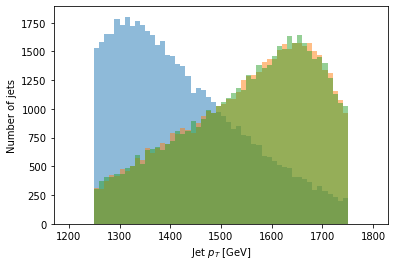

In [9]:
# Jet pT distribution *without* weights
plt.hist(df_variables.query('signal == 0')[var], bins=bins, alpha=0.5);
plt.hist(df_variables.query('signal == 1')[var], bins=bins, alpha=0.5);
plt.hist(df_variables.query('signal == 2')[var], bins=bins, alpha=0.5);
plt.xlabel('Jet $p_{T}$ [GeV]');
plt.ylabel('Number of jets');

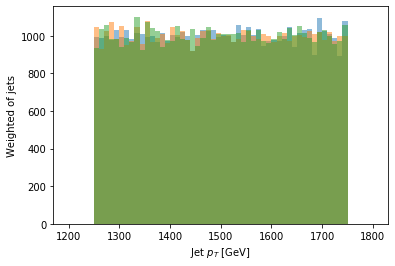

In [10]:
# Jet pT distribution *with* weights
plt.hist(df_variables.query('signal == 0')[var], bins=bins, alpha=0.5, weights=df_variables.query('signal == 0')['weight']);
plt.hist(df_variables.query('signal == 1')[var], bins=bins, alpha=0.5, weights=df_variables.query('signal == 1')['weight']);
plt.hist(df_variables.query('signal == 2')[var], bins=bins, alpha=0.5, weights=df_variables.query('signal == 2')['weight']);
plt.xlabel('Jet $p_{T}$ [GeV]');
plt.ylabel('Weighted of jets');

### Explore images

      Background       |       Signal 1        |       Signal 2


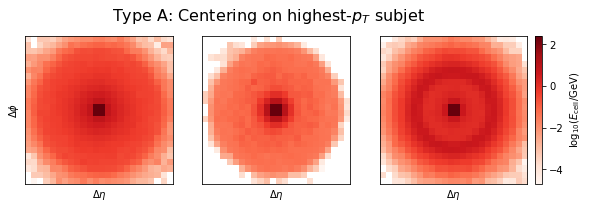

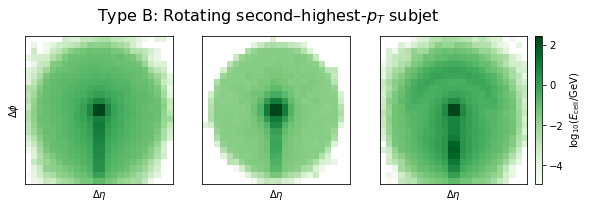

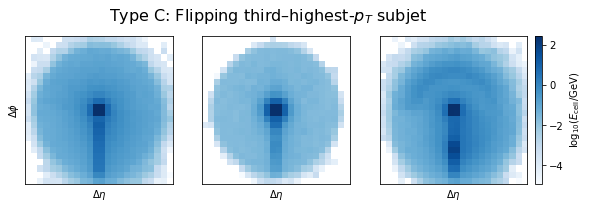

In [11]:
kwargs = dict(layout=(1,3), colorbar='$\\log_{10} (E_{\\mathrm{cell}} / \\mathrm{GeV})$', 
              xlabel='$\\Delta \\eta$', ylabel='$\\Delta \\phi$', size=6)

def GetAverageImage (array):
    averageImage = array.mean(axis=0)
    maskZero     = (averageImage == 0)
    averageImage[maskZero] = 1.0E-09
    averageImage = np.log10(averageImage)
    averageImage[maskZero] = np.nan
    return averageImage

print('{0}Background {0}|{0} Signal 1  {0}|{0} Signal 2'.format(' ' * 6))
plot.image([GetAverageImage(imgsA[signal == 0]), 
            GetAverageImage(imgsA[signal == 1]), 
            GetAverageImage(imgsA[signal == 2])], cmap='Reds',   title='Type A: Centering on highest-$p_{T}$ subjet',    **kwargs);
plot.image([GetAverageImage(imgsB[signal == 0]), 
            GetAverageImage(imgsB[signal == 1]), 
            GetAverageImage(imgsB[signal == 2])], cmap='Greens', title='Type B: Rotating second–highest-$p_{T}$ subjet', **kwargs);
plot.image([GetAverageImage(imgsC[signal == 0]), 
            GetAverageImage(imgsC[signal == 1]), 
            GetAverageImage(imgsC[signal == 2])], cmap='Blues',  title='Type C: Flipping third–highest-$p_{T}$ subjet',  **kwargs);

### Example random submission

In [12]:
df_test = pd.read_hdf(dir_test + 'variables.h5')
nb_test = df_test.shape[0]

# Binary: Background vs. signals 1 and 2. Save either...
# -- ... predicted class *probabilities* ...
random_binary = np.random.rand(nb_test)            # Floats, in range [0, 1] with 
                                                   # values towards "0" meaning 
                                                   # most likely background, and 
                                                   # values towards "1" meaning 
                                                   # most likely any signal.

# -- ... or predicted class *labels* ...
random_binary = np.random.choice(2, size=nb_test)  # Integers, either "0" (background) 
                                                   # or "1" (any signal)

your_uun_without_the_first_s=1604379
    
# -- ... and save your submission
project.save_submission(random_binary, your_uun_without_the_first_s)

# Multiclass: Background vs. signal 1 vs. signal 2. Save either
# -- ... predicted class *probabilities* ...
random_multiclass  = np.random.rand(nb_test, 3)
random_multiclass /= random_multiclass.sum(axis=1).reshape(-1, 1)  # Scale each row to have sum 1

# -- ... or predicted class *labels* ...
random_multiclass  = np.random.choice(3, size=nb_test)

# -- ... and save your submission
project.save_submission(random_multiclass, your_uun_without_the_first_s)

Got integer predictions; assuming class labels.
Saving predictions to file: preds-s1604379-binary.csv
Got integer predictions; assuming class labels.
Saving predictions to file: preds-s1604379-multiclass.csv


In [13]:
# This is an example of how to predictions will be evaluated. In this example, 
# we will use a simple selection on the "tau21" variable to perform binary 
# classification. NB: When calculating the leaderboard scores, we *will be 
# using* weights like the provided ones.
tau21_selection = (df_variables['tau21'] < 0.5).values  # i.e. signal (type == 1) 
                                                        # if `tau21 < 0.5`, otherwise 
                                                        # background (type == 0)

print("Accuracy calculated *without* the provided weights (i.e. giving all jets the same weight of 1)")
acc = project.evaluate(tau21_selection, signal)
print("  {:.2f}%".format(100. * acc))

print("Accuracy calculated *with*    the provided weights")
acc = project.evaluate(tau21_selection, signal, weight)
print("  {:.2f}%".format(100. * acc))

Accuracy calculated *without* the provided weights (i.e. giving all jets the same weight of 1)
  74.93%
Accuracy calculated *with*    the provided weights
  74.57%


---

## Header

Your work goes here...

In [14]:
#### Decision Tree Classifier for high-level variables

In [12]:
#### Decision Tree based classifier on high-level variables
## Data preprocessing for training data
dt_train = df_variables.copy()

# drop duplicates - in the extremely unlikely case that there is a duplicate signal
dt_train = dt_train.drop_duplicates()
# remove any signals with high-level variables with nan values
nan = np.any(np.isnan(dt_train), axis=1)
dt_train = dt_train[~nan]

dt_train.head()

,signal,weight,pt,eta,phi,mass,trimmed_mass,tau1,tau2,tau3,...,e2_2,e3_1,e3_2,C2_1,C2_2,D2_1,D2_2,KtDR,split12,zcut12
0,0.0,0.754563,1429.054644,-0.028279,-1.439182,580.472667,577.555367,0.367105,0.123122,0.073896,...,0.172761,0.013206,2.353134e-03,0.216721,0.078841,0.877957,0.456359,0.827116,4.260592,0.030324
1,1.0,1.310081,1408.621118,0.130361,1.020697,141.026068,122.603590,0.086625,0.022405,0.007289,...,0.010039,0.000190,1.966541e-05,0.078947,0.195127,1.607889,19.436861,0.164426,3.186888,0.067179
2,1.0,1.192072,1435.895464,0.920718,1.786299,103.053433,102.466559,0.059406,0.007547,0.006387,...,0.005145,0.000027,5.416519e-08,0.024938,0.002046,0.762363,0.397717,0.165370,2.727562,0.067331
3,0.0,1.041173,1498.936431,-1.539387,1.602722,106.238439,19.442190,0.013582,0.015790,0.010710,...,0.005015,0.000035,5.159801e-06,0.272764,0.205177,24.135950,40.914481,0.012364,1.701913,0.026541
4,2.0,0.635794,1647.535791,-0.091315,2.582996,436.770586,383.033950,0.222138,0.047988,0.029031,...,0.070069,0.002468,4.849675e-04,0.152270,0.098777,1.196044,1.409698,0.552331,3.821762,0.032358


In [13]:
## Data preprocessing for testing data 
dt_test = pd.read_hdf(dir_test + 'variables.h5')

# drop duplicates - in the extremely unlikely case that there is a duplicate signal
dt_test = dt_test.drop_duplicates()
# remove any signals with high-level variables with nan values
nan = np.any(np.isnan(dt_test), axis=1)
dt_test = dt_test[~nan]

dt_test.head()

,weight,pt,eta,phi,mass,trimmed_mass,tau1,tau2,tau3,tau21,...,e2_2,e3_1,e3_2,C2_1,C2_2,D2_1,D2_2,KtDR,split12,zcut12
0,0.940782,1735.834131,0.489992,-1.517475,100.580413,100.580413,0.055725,0.015800,0.011629,0.283530,...,0.003361,0.000029,1.478307e-08,0.027805,0.001309,0.861257,0.389444,0.108880,3.033545,0.083824
1,0.658440,1621.077737,-0.823925,-1.209862,155.227599,99.430853,0.063673,0.016874,0.009614,0.265016,...,0.008815,0.000191,1.867014e-05,0.137558,0.240275,3.694647,27.257714,0.121687,3.003165,0.054911
2,1.461412,1384.084161,1.200745,-3.050105,484.767917,475.404946,0.307098,0.103816,0.067640,0.338056,...,0.118616,0.006676,1.070570e-03,0.188904,0.076090,1.004882,0.641486,0.626497,4.298109,0.036709
3,0.623806,1266.522170,-0.221769,-1.602123,126.281673,92.101698,0.044746,0.035357,0.030875,0.790175,...,0.009998,0.000262,3.325854e-05,0.202477,0.332735,5.632943,33.280936,0.213076,2.077267,0.033041
4,0.580242,1338.132515,1.006676,1.252434,245.766952,28.625185,0.068411,0.023419,0.014833,0.342322,...,0.034436,0.000513,4.892882e-05,0.225194,0.041260,4.717192,1.198144,0.933191,2.627533,0.027324


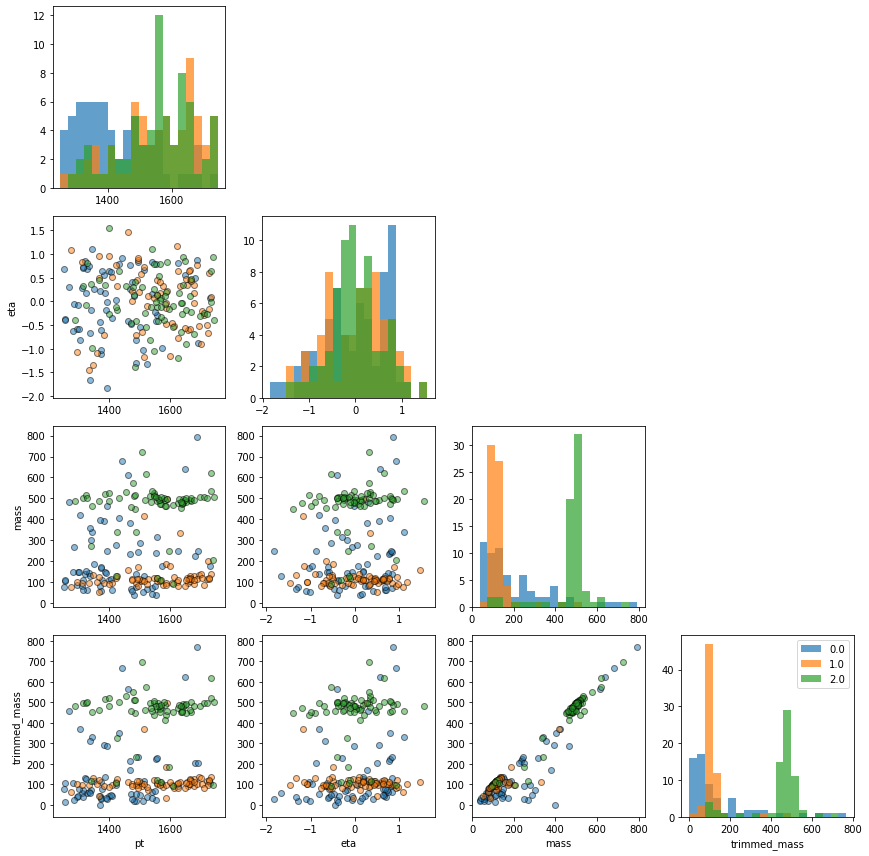

In [17]:
## Visualisation
# choose some choice features to visual on pair_grid plots
sample = dt_train.sample(n=200, replace=False)

target = ['signal']
features1 = ['pt', 'eta', 'mass', 'trimmed_mass']
sample = sample[target+features1]
fig = plot.pair_grid(sample, target='signal', features=features1, nbins=20)

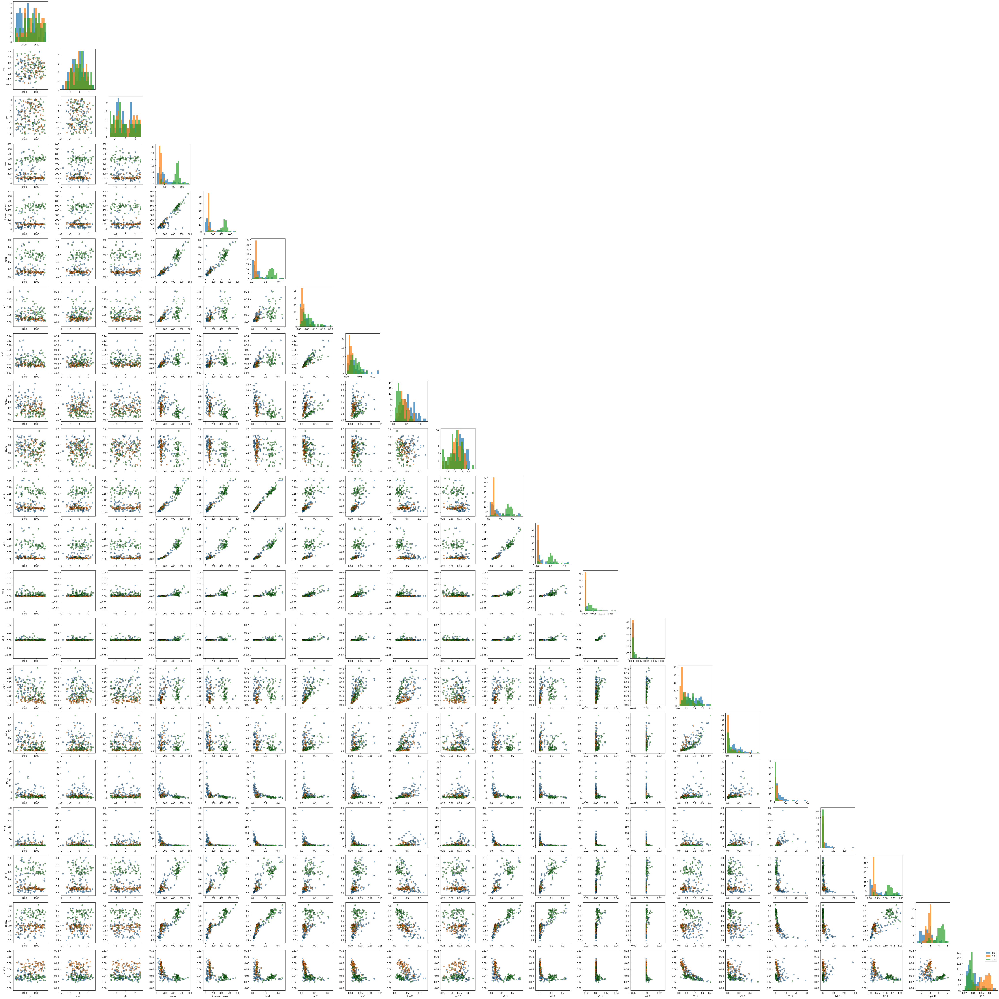

In [18]:
### Extra Visualisation of useful parameters
# the purpose of this is to see what parameters are clustered in a useful way
# we can exclude parameters that are not useful from training
sample = dt_train.sample(n=200, replace=False)

target = ['signal']
f_features = dt_train.iloc[:,2:].columns.values.tolist()

fig = plot.pair_grid(sample, target='signal', features=f_features,nbins=20)

#### Parameter exclusion
Clearly, there are a lot of variables and the idea of data preprocessing should be that we should exclude variables that do not cluster the signals into clearly separate areas.

Therefore, I have decided to exclude D2_1 and D2_2 parameters from training as they are appear unhelpful in multiclass signal classification. The other variables do contribute to multi signal classification in some way, therefore I have decided to keep them in the data set.

As will become clear, this does make data visualisation of the classification algorithm difficult because there are  19 variables to pair plot, with each

In [19]:
## Fit the Decision Tree to the data
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

# define parameters for DT ensembles
max_depth = 50

# fit the decision tree with the features and the target
clf = DecisionTreeClassifier(max_depth=max_depth)

# define training data, target training data and weights arrays
# exclude useless parameters from training
X_train = dt_train.iloc[:,2:]
X_train.drop(['D2_1', 'D2_2'], 1, inplace=True)

y_train = dt_train.iloc[:,0]
weights_train = dt_train.iloc[:,1]

score = cross_val_score(clf, X_train, y_train, cv=5, verbose=1)
print('The mean result of the CV-scores are : '+str(np.mean(score)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The mean result of the CV-scores are : 0.80942


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   33.3s finished


#### Evaluation of Decision Tree
It is clear that the Decision Tree, despite having a relatively large node branch depth of 50, is actually at the lower end of classification accuracy of what can be expected. Decision Trees themselves are not very well suited for big data, especially when the big data has Variety. To mitigate this, I have the decision tree an extremely large branch depth, hoping that it would capture the complexity in the data. See below for discussion on how well it does this.

In [20]:
# fit the classifier so that we can visualise how it classifies
clf.fit(X_train, y_train, sample_weight=weights_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=50,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

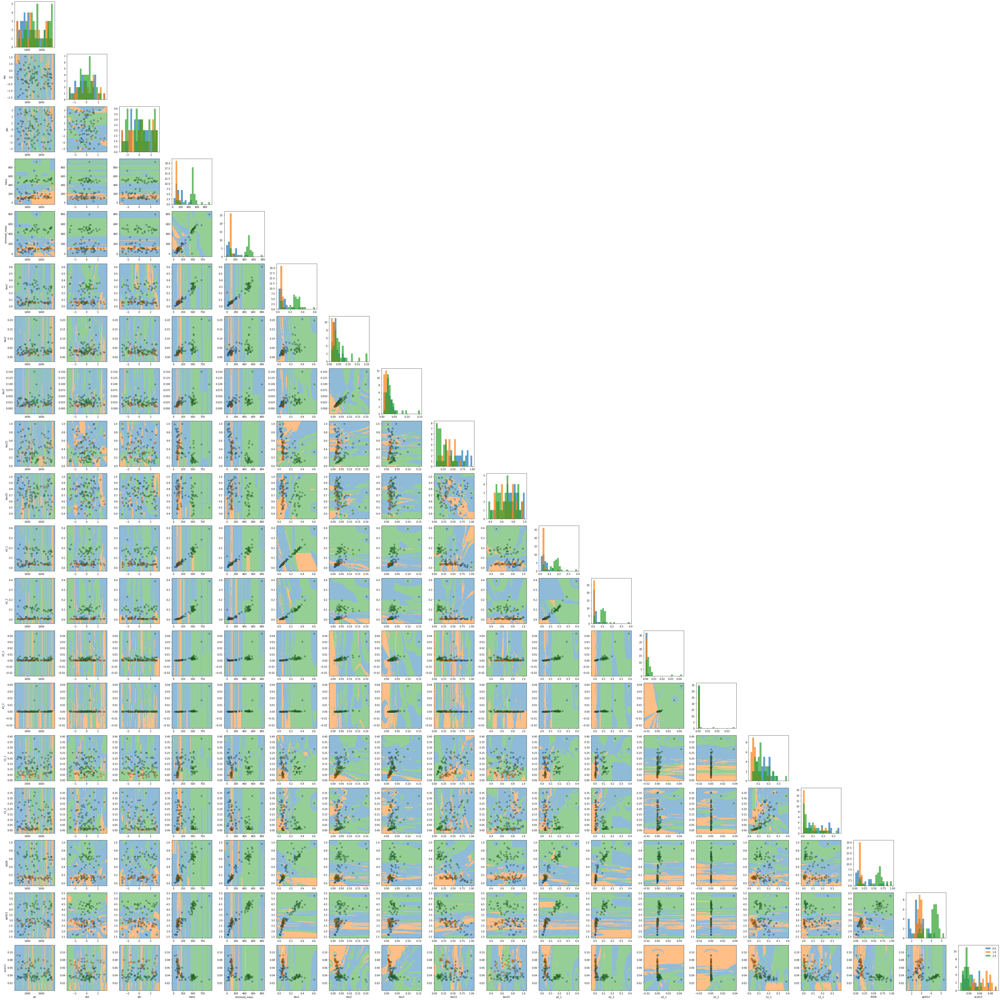

In [21]:
# plot the pairs of features of the fitted classifier
sample = dt_train.sample(n=100, replace=False)
sample.drop(['D2_1', 'D2_2'], 1, inplace=True)

sample_features = sample.columns.tolist()
sample_features.remove('signal')
sample_features.remove('weight')

fig = plot.pair_grid(sample, target='signal', features=sample_features, clf=clf, nbins=20)

#### Visualisation of Decision Tree Classifier 
Clearly, the Decision Tree does manage to separate the obvious signal clusters apart and that's why it so easily achieves accuracy scores of 80%. However, there are streaks in the classification plot that aren't smooth signal areas and this could be that it is trying to fit different signals that are clustered together closely and it overfits them. This links to what was said above, that the DT actually captures too much of the complexity of the data at the expense of the accuracy.

I shall try AdaBoost Decision trees and Random Forest Decision Trees to see if they aid in the classification. I anticipate that the 

In [22]:
### Save accuracy of Classifier on test data
X_test = dt_test.iloc[:,1:]
X_test.drop(['D2_1', 'D2_2'], 1, inplace=True)

y_pred = clf.predict_proba(X_test)

# it's a very basic submission for the predictions of X_pred but it's a good starting point
project.save_submission(y_pred, 1604379)

Got floating-point predictions; assuming class probabilities.
Got an array with three columns. Assuming background (type 0), signal 1, and signal 2 probabilities.
Saving predictions to file: preds-s1604379-multiclass.csv


/Users/AaronElijah/anaconda3/anaconda3/envs/tensorflow_env/lib/python3.7/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [23]:
### Now apply Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

max_depth = 30
n_estimators = 10

rf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth)

# fit ensemble method
score = cross_val_score(rf, X_train, y_train, cv=5, verbose=1)
print('The mean result of the CV-scores are : '+str(np.mean(score)))
rf.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   46.5s finished


The mean result of the CV-scores are : 0.8732666666666665


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=30, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

#### Evaluation of Random Forest Classifier 
A random forest classifier creates n_estimators number of datasets from the original dataset. Each pseudo-dataset is uniformly randomly sampled from the original, with replacement (so duplicates can occur). Ensemble prediction is the average node conditions and predictions of the N pseudo-datasets. Hence region boundaries are not well defined as in AdaBoost classifiers. Because each region is actually averaged from the regions found on N pseudo-datasets. 

This prevents the overfitting problem seen above as it makes overfitted regions into gradiated boundaries instead of sharp boundaries. This comes with the added benefit of being a far superior classifier to the Decision Tree alone.

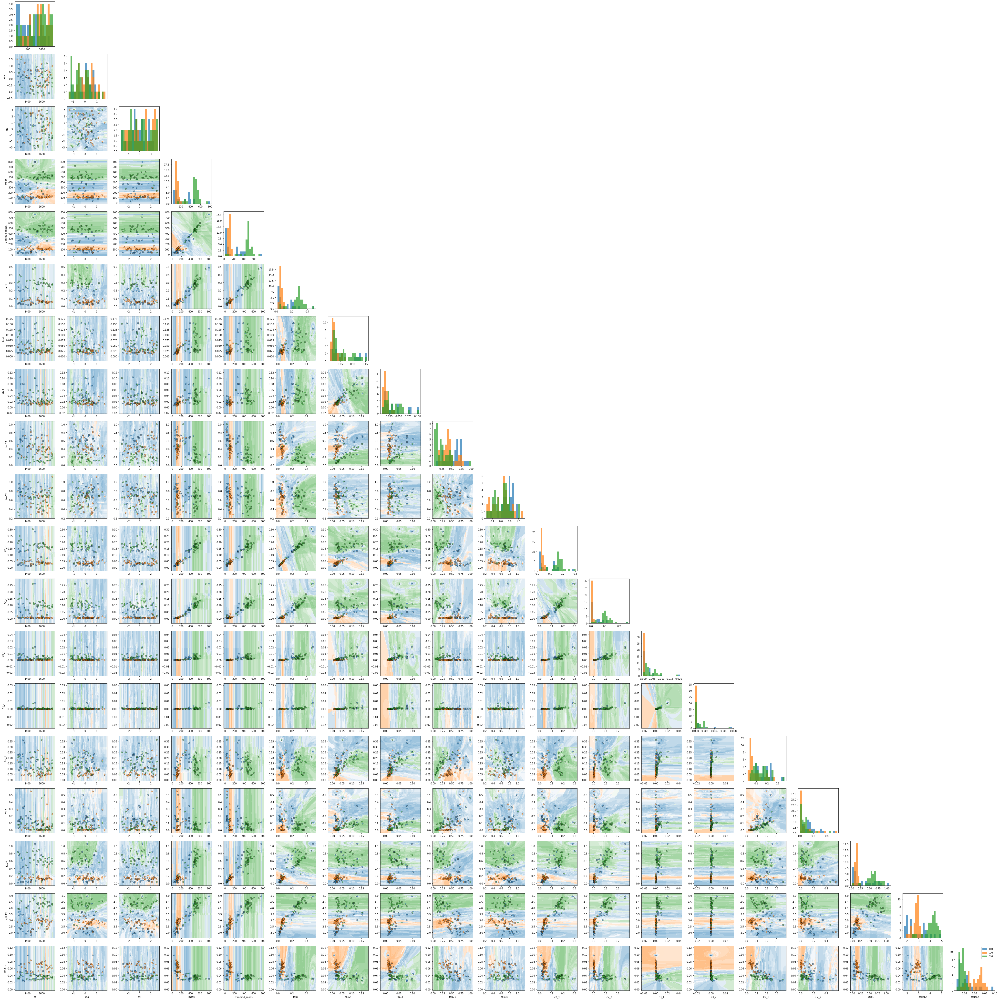

In [24]:
# plot the pairs of features of the fitted classifier
sample = dt_train.sample(n=100, replace=False)
sample.drop(['D2_1', 'D2_2'], 1, inplace=True)

sample_features = sample.columns.tolist()
sample_features.remove('signal')
sample_features.remove('weight')

fig = plot.pair_grid(sample, target='signal', features=sample_features, clf=rf, nbins=20)

#### Visualisation of Random Forest Tree Classifier 
One can see a visualisation of the descrpition described in the evaluation. There is now no problem with the overfitting as before.

However, one could argue that it could be underfitting. For many variables the graphs appear not to have regions which are strongly associated with a particular signal. This may affect the size of the probabilities attributed to the predicted class (i.e. it doesn't give a +90% probability for the predicted class as the previous decision tree did).

In [25]:
### Show accuracy of Random Forest Classifier
y_pred = rf.predict_proba(X_test)
print(y_pred)
project.save_submission(y_pred, 1604379)

[[3.88198758e-05 9.99456522e-01 5.04658385e-04]
 [0.00000000e+00 9.00000000e-01 1.00000000e-01]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]
 ...
 [8.00000000e-01 1.00000000e-01 1.00000000e-01]
 [8.00000000e-01 0.00000000e+00 2.00000000e-01]
 [1.88745655e-03 2.61780105e-03 9.95494742e-01]]
Got floating-point predictions; assuming class probabilities.
Got an array with three columns. Assuming background (type 0), signal 1, and signal 2 probabilities.
Saving predictions to file: preds-s1604379-multiclass.csv


In [26]:
### Now apply AdaBoost classifier
from sklearn.ensemble import AdaBoostClassifier

# set parameters for ensemble method
max_depth = 30
n_estimators = 10

# Fit an AdaBoost BDT classifier
bclf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=max_depth),
                         n_estimators=n_estimators)
# fit ensemble method
score = cross_val_score(bclf, X_train, y_train, cv=5, verbose=1)
print('The mean result of the CV-scores are : '+str(np.mean(score)))
bclf.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  4.3min finished


The mean result of the CV-scores are : 0.8632000000000002


AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(class_weight=None,
                                                         criterion='gini',
                                                         max_depth=30,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort=False,
                                                         random_state=None,
                            

#### Model Evaluation of Adaptive Boosting Tree Classifier 

Clearly this model works better than the Decision Tree alone, but it doesn't improve on the results already collected by the Random Forest Classifier. 

As opposed to the Random Forest, the Adaptive Boosting biases the model to train on misclassified data more by increasing it's weight during the training stage. This does mean that the classifier has distinctive regions for the signals. This actually is very similar to the original Decision Tree.

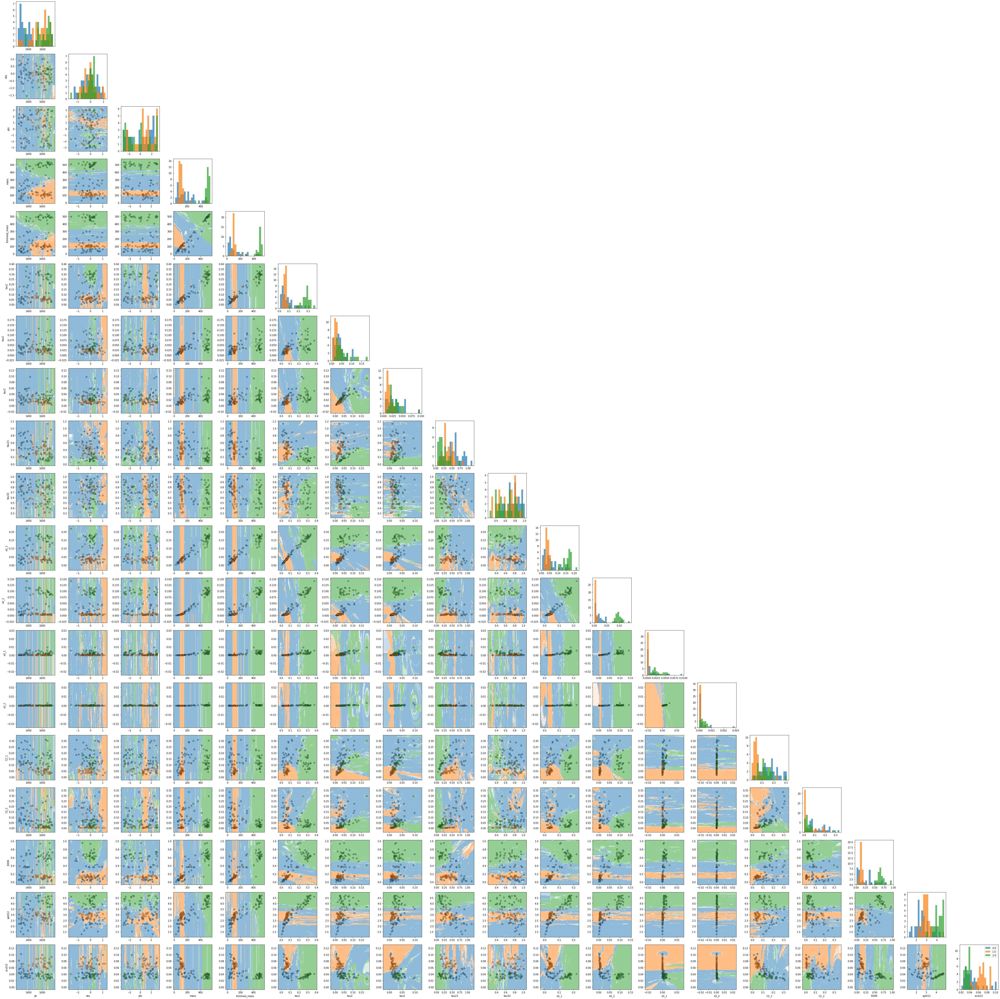

In [27]:
# plot the pairs of features of the fitted classifier
sample = dt_train.sample(n=100, replace=False)
sample.drop(['D2_1', 'D2_2'], 1, inplace=True)

sample_features = sample.columns.tolist()
sample_features.remove('signal')
sample_features.remove('weight')

fig = plot.pair_grid(sample, target='signal', features=sample_features, clf=bclf, nbins=20)

#### Visualisation of Adaptive Boosting Classifier
As mentioned before, one can see there are clearly marked regions for the signals. However, unlike the original Decision Tree, it reduces the strange overfitted streaks of regions. It does this because those streaks are caused by it treating each datapoint differently, such that clustered data points which are harder to classify are paid more attention than ones that are easier to classify. 

#### Create Image Auto-Encoder
Moving on to images, it would be interesting to see how well an auto-encoder will detect anomalous jet stream data

In [15]:
### Keras import(s)
from tensorflow.python.keras.utils import plot_model
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.layers import Input, Dense, Flatten, Reshape, Conv2D, MaxPooling2D, AveragePooling2D, UpSampling2D

from tensorflow.python.keras.backend import set_image_data_format
set_image_data_format('channels_last')  # Images are formatted as (N, N, 1), with colour-channels last

from PIL import Image 

In [16]:
# print the maximum pixel amplitude and normalise it so that the classifier can actually use it's loss function
print(np.max(imgsA))

1667.9979248046877


In [17]:
# Add colour axis to image datasets
# normalise the images
imgsA = imgsA[:,:,:,np.newaxis]/1668
imgsB = imgsB[:,:,:,np.newaxis]/1668
imgsC = imgsC[:,:,:,np.newaxis]/1668

image_shape_new = imgsA[0].shape

In [18]:
### Construct the Encoder
# define input, output, convolution and pooling layers
inputs = Input(shape=image_shape_new)
x = Conv2D(16, (3 , 3), activation='relu', padding='same')(inputs)
x = MaxPooling2D(pool_size=(2,2))(x)

x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(8, (3 , 3), activation='relu', padding='same')(x)
x = Conv2D(4, (3 , 3), activation='relu', padding='same')(x)

x = Conv2D(2, (3 , 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2,2))(x)

x = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

outputs = Flatten()(x)

# create encoder
encoder = Model(inputs=inputs, outputs=outputs, name='encoder')
encoder.summary()

Model: "encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 24, 24, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 24, 24, 16)        160       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 12, 12, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 12, 12, 8)         1160      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 12, 12, 8)         584       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 12, 12, 4)         292       
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 12, 12, 2)         74  

In [19]:
### Construct the decoder
inputs = Input(shape=encoder.output_shape)
x = Reshape((6, 6, 1))(inputs)

x = UpSampling2D(input_shape=(2,2))(x)
x = Conv2D(2, (3, 3), activation='relu', padding='same')(x)

x = Conv2D(4, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)


x = UpSampling2D(input_shape=(2,2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)

# must use sigmoid for activation
# softmax weights all the final outputs, which is not helpful for direct comparision to original images in an auto-encoder
outputs = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# create decoder
decoder = Model(inputs=inputs, outputs=outputs, name='decoder')
decoder.summary()

Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, 36)]        0         
_________________________________________________________________
reshape (Reshape)            (None, 6, 6, 1)           0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 12, 12, 1)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 12, 12, 2)         20        
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 12, 12, 4)         76        
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 12, 12, 8)         296       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 12, 12, 8)         584 

In [20]:
# Construct the Auto-Encoder
# ensure that encoder and decoder posses the same architecture but mirrors of each other
i = encoder.input
cae = Model(i, decoder(encoder(i)), name='CAE')
cae.summary()

Model: "CAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 24, 24, 1)]       0         
_________________________________________________________________
encoder (Model)              (None, 36)                2289      
_________________________________________________________________
decoder (Model)              (None, 24, 24, 1)         2289      
Total params: 4,578
Trainable params: 4,578
Non-trainable params: 0
_________________________________________________________________


Train on 120000 samples, validate on 30000 samples
Epoch 1/3
120000/120000 [==============================] - 174s 1ms/sample - loss: 0.0208 - accuracy: 0.9653 - val_loss: 0.0063 - val_accuracy: 0.9656
Epoch 2/3
120000/120000 [==============================] - 164s 1ms/sample - loss: 0.0054 - accuracy: 0.9659 - val_loss: 0.0050 - val_accuracy: 0.9656
Epoch 3/3
120000/120000 [==============================] - 169s 1ms/sample - loss: 0.0047 - accuracy: 0.9659 - val_loss: 0.0045 - val_accuracy: 0.9656


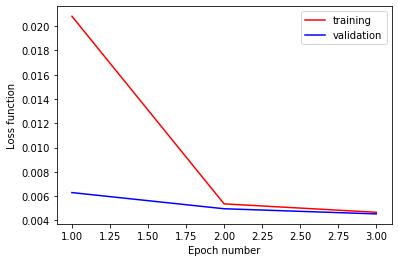

In [21]:
### compile and train auto-encoder
cae.compile(loss='binary_crossentropy', optimizer='Adam', metrics=['accuracy'])
cae.fit(imgsC, imgsC, batch_size=100, epochs=3, validation_split=0.2, shuffle=True, verbose=True)

# plot loss functions for training and validation datasets for auto-encoder
loss = cae.history.history['loss']
val_loss = cae.history.history['val_loss']
epochs = np.arange(1,4)

# plot the loss functions for the training and validation dataset
plt.plot(epochs, loss, color='r', label='training')
plt.plot(epochs, val_loss, color='b', label='validation')
plt.legend()
plt.xlabel('Epoch number'), plt.ylabel('Loss function')
plt.show()

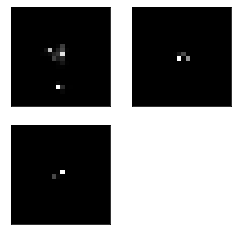

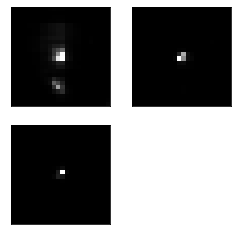

In [22]:
# perform auto-encoding to create auto-encoded images
# compare with the originals
imgsC_pred = cae.predict(imgsC)

fig1 = plot.image(imgsC[0:3,])
fig2 = plot.image(imgsC_pred[0:3,])

#### Image prediction
It seems to do a fairly good job at compressing and reconstructing the images. It has a mean accuracy of around 96.6%, which is fairly typical for auto-encoder accuracy on image construction (albeit slightly on the low side).
A reason for this good but fairly unimpressive accuracy is that whilst there are many images to train on, the images themselves are very sparse matrices. So actually they don't convey that much of data for the auto-encoder to train on.

The number of samples in "outlier" dataset faces is : 400


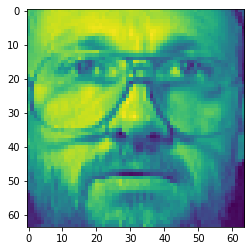

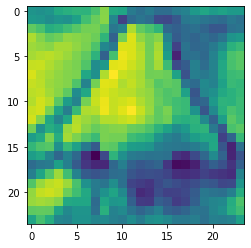

The shape of the images is : (24, 24, 1)


In [23]:
### Get some fake images to put into the auto-encoder
### See how succesful it is at detecting fakes
from sklearn.datasets import fetch_olivetti_faces
faces = fetch_olivetti_faces(shuffle=True)['images']

### Note that faces are already normalised images
print('The number of samples in "outlier" dataset faces is : '+str(faces.shape[0]))

# show a random face
plt.imshow(faces[0])
plt.show()

# ensure face images have same size as images we use
faces = faces[:,20:-20,20:-20,np.newaxis]

# check new face
plt.imshow(faces[0,:,:,0])
plt.show()

print('The shape of the images is : '+str(faces.shape[1:]))

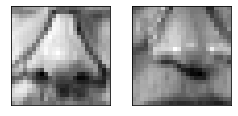

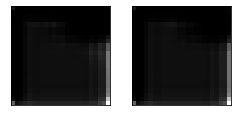

In [24]:
# plot how the auto-encoder compresses and constructs the images chosen
faces_pred = cae.predict(faces)
fig1 = plot.image(faces[0:2,])
fig2 = plot.image(faces_pred[0:2,])

In [32]:
# Combined particle jet images and face "outliers" in a mixed dataset
mixed = np.vstack((imgsC[0:200], faces))

# Shuffle the mixed dataset so the "outliers" are randomly distributed
indices = np.random.permutation(mixed.shape[0])
mixed   = mixed[indices]

In [33]:
def binary_crossentropy(img_in, img_out):
    assert img_in.shape == img_out.shape
    eps = np.finfo(float).eps
    img_out = np.clip(img_out, eps, 1. - eps)
    return - (img_in * np.log(img_out) + (1 - img_in) * np.log(1 - img_out))

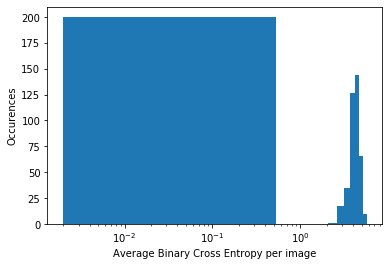

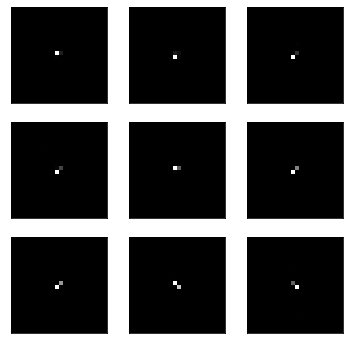

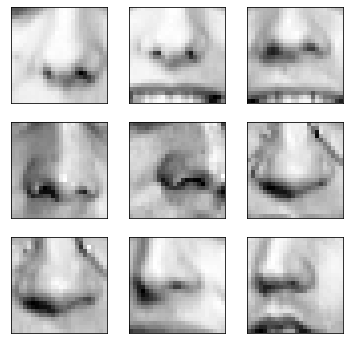

In [34]:
# compute average BCE value for each image
def difference(img_in, img_out):
    # note that binary_crossentropy asserts that img_in and img_out have the same shape
    bce_mat = binary_crossentropy(img_in, img_out)
    bce_av = np.sum(bce_mat)/np.prod(img_in.shape)
    return bce_av

# get auto-encoded images
mixed_pred = cae.predict(mixed, verbose=False)

# compute average BCE values for each pair of input and output images
diffs = np.zeros(mixed.shape[0])
for i in range(mixed.shape[0]):
    diff = difference(mixed[i,], mixed_pred[i,])
    diffs[i] = diff

# plot histogram of differences
plt.hist(diffs, bins='auto')
plt.xscale('log')
plt.xlabel('Average Binary Cross Entropy per image'), plt.ylabel('Occurences')
plt.show()

# np.argsort returns an array of the indexes of diffs that are ordered from smallest element to largest
# essentially the same as np.sort but for index values and not elements themselves
diffs_argsort = np.argsort(diffs)

# plot the images with least average BCE per image and vice versa
fig1 = plot.image(mixed[diffs_argsort[0:9,]])
fig2 = plot.image(mixed[diffs_argsort[-1-9:-1,]])

#### Anomaly Detection of fake images
It does an extremely good job at telling the real data from the 'faces' data. This is clear from the graph of the binary cross-entropy difference between input and output images. The faces clearly have a huge BCE average value than the actual data.

This should come as no surprise; the 'faces' images are detailed and not sparse matrices, which is the opposite to the image data we have. It is no challenge to auto-encoder to tell these two kings of images apart.

### NN Hyperparameter optimisation

Let's see how hyperparameter optimisation can produce a NN that can optimise how we can train classifier to more accurately classify the high-level data to a signal.

In [35]:
# relevant imports for neural networks using sklearn framework
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

In [36]:
# import class for MLPClassifier that will take nb_layers and nb_nodes_per_layer as an argument to optimise
class MLPClassifierWrapper(MLPClassifier):
    """
    Wrapper around `sklearn.neural_network.MLPClassifier` with a convenient set 
    of properties (nb_layers and nb_nodes_per_layer) suitable for hyperparameter 
    optimisation exercises.
    
    Arguments:
        nb_layers: Integer, number of hidden layers
        nb_nodes_per_layer: Number of nodes per hidden layer, taken to be the 
            same for all for convenience.
    """

    def __init__ (self, nb_layers=1, nb_nodes_per_layer=100, **kwargs):
        
        # Member variables
        self._nb_layers = nb_layers
        self._nb_nodes_per_layer = nb_nodes_per_layer  
        
        # Call base class (`MLPClassifier`) constructor
        super(MLPClassifierWrapper, self).__init__(**kwargs)
        
        # Trigger `_set_architecture`
        self._set_architecture()
        return

    @property
    def nb_layers(self):
        return self._nb_layers
    
    @property
    def nb_nodes_per_layer(self):
        return self._nb_nodes_per_layer 

    @nb_layers.setter
    def nb_layers(self, value):
        self._nb_layers = value
        self._set_architecture()
        return
    
    @nb_nodes_per_layer.setter
    def nb_nodes_per_layer(self, value):
        self._nb_nodes_per_layer = value
        self._set_architecture()
        return
    
    def _set_architecture (self):
        """
        Sets the `hidden_layer_sizes` parameter of the base `MLPClassifier` 
        class, based on the two custom parameters we have chosen.
        """
        
        self.hidden_layer_sizes = tuple([self._nb_nodes_per_layer for _ in range(self._nb_layers)])
        return
    pass

In [ ]:
# create a dictionary of parameters to test
nb_layers = list(np.arange(1, 3, 1))
nb_nodes_per_layer = list(np.arange(1, 21, 10))

param_grid = {'nb_layers':nb_layers, 'nb_nodes_per_layer':nb_nodes_per_layer}
print(param_grid)

In [ ]:
# create the training data
# ensure we remove the excess variables that do not help in the classifing process
X_train = dt_train.iloc[:,2:]
X_train.drop(['D2_1', 'D2_2'], 1, inplace=True)
y_train = dt_train.iloc[:,0]

# create the NN with the wrapper used
# Let the classifier be used as the estimator for the classifier chosen
mlp = MLPClassifierWrapper(verbose=True)
clf = GridSearchCV(mlp, param_grid, cv=3)

# fit the classifier to the parameter values in the grid with a 3-fold cross validation
clf.fit(X_train, y_train)

In [ ]:
# plot the cross-validation scores on a grid
plot.optimisation(clf)

#### Evaluation of Hyperparameter fit
The issue with Grid Search is that it has a 'curse of dimensionality'. Testing a wide parameter space essentially causes the nested loop for fitting the classifier to increase quadratically. This means that actually getting meaningful results is extremely difficult, unless one has a lot of computational power to play with.

Therefore, I conclude that to provide with Hyperparameter fitting, more computational power is needed or multiple experiments were one could 'hone' in on the correct values. This would be an interesting minimisation problem.